In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.svm import SVC
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist

In [10]:
df_test = pd.read_csv('C:/Users/Kiana Kazeminejad/OneDrive - University of Calgary\WiDS 2025 Kiana/TEST/TEST_FUNCTIONAL_CONNECTOME_MATRICES.csv')
df_test.head()

,participant_id,0throw_1thcolumn,0throw_2thcolumn,0throw_3thcolumn,0throw_4thcolumn,0throw_5thcolumn,0throw_6thcolumn,0throw_7thcolumn,0throw_8thcolumn,0throw_9thcolumn,...,195throw_196thcolumn,195throw_197thcolumn,195throw_198thcolumn,195throw_199thcolumn,196throw_197thcolumn,196throw_198thcolumn,196throw_199thcolumn,197throw_198thcolumn,197throw_199thcolumn,198throw_199thcolumn
0,Cfwaf5FX7jWK,0.548480,0.713607,0.557319,0.524369,0.693364,0.770032,0.724406,0.390118,0.547912,...,0.080423,-0.054581,-0.088163,-0.028574,0.444847,0.350149,-0.012601,0.665750,0.560565,0.555732
1,vhGrzmvA3Hjq,0.427740,0.363022,0.402862,0.363003,0.534558,0.345347,0.409471,0.303328,0.402515,...,0.198009,-0.000724,0.083122,0.033043,0.687497,0.306229,0.717485,0.461809,0.559632,0.350027
2,ULliyEXjy4OV,0.139572,0.390106,-0.087041,0.196852,0.088148,0.023843,0.381782,0.068979,0.377488,...,0.051319,0.023630,-0.056819,0.117396,0.576086,0.517831,0.527044,0.605038,0.609856,0.750987
3,LZfeAb1xMtql,0.133561,0.778326,0.416355,0.471840,0.568460,0.633660,0.501113,0.345461,0.467943,...,0.046183,-0.238962,0.121868,-0.260970,0.646818,0.594902,0.608156,0.595459,0.683189,0.542296
4,EnFOUv0YK1RG,0.126699,0.575446,0.509422,0.363193,0.427544,0.449924,0.451796,0.223927,0.298248,...,0.315734,0.002234,0.290791,0.344149,0.480214,0.539824,0.447322,0.293088,0.148529,0.539823


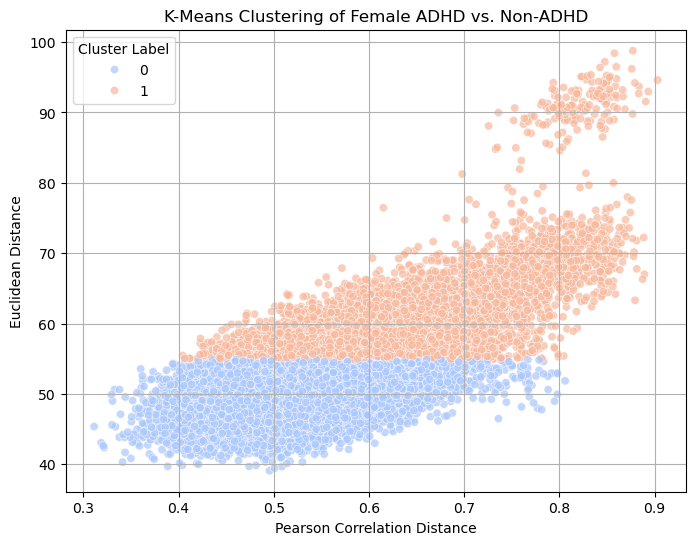

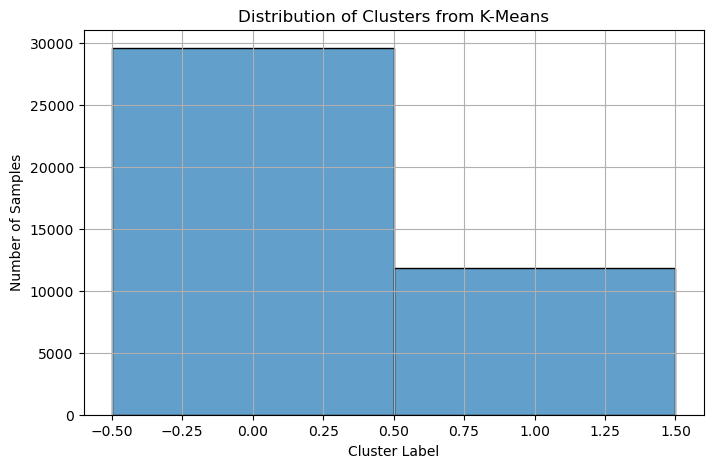

In [11]:
df_connectome = pd.read_csv('C:/Users/Kiana Kazeminejad/OneDrive - University of Calgary\WiDS 2025 Kiana/TRAIN_NEW/TRAIN_FUNCTIONAL_CONNECTOME_MATRICES_new_36P_Pearson.csv')
df_target = pd.read_excel('C:/Users/Kiana Kazeminejad/OneDrive - University of Calgary\WiDS 2025 Kiana/TRAIN_NEW/TRAINING_SOLUTIONS.xlsx')

df_hasADHD_F = df_target[(df_target["ADHD_Outcome"] == 1) & (df_target["Sex_F"] == 1)] 
df_hasADHD_M = df_target[(df_target["ADHD_Outcome"] == 1) & (df_target["Sex_F"] == 0)]
df_noADHD_F = df_target[(df_target["ADHD_Outcome"] == 0) & (df_target["Sex_F"] == 1)]
df_noADHD_M = df_target[(df_target["ADHD_Outcome"] == 0) & (df_target["Sex_F"] == 0)]

df_connectome_hasADHD_F = df_connectome[df_connectome['participant_id'].isin(df_hasADHD_F['participant_id'])]
df_connectome_hasADHD_M = df_connectome[df_connectome['participant_id'].isin(df_hasADHD_M['participant_id'])]
df_connectome_noADHD_F = df_connectome[df_connectome['participant_id'].isin(df_noADHD_F['participant_id'])]
df_connectome_noADHD_M = df_connectome[df_connectome['participant_id'].isin(df_noADHD_M['participant_id'])]

num_regions = 200 
# with ADHD Female
# Drop the participant_id column to keep only connectivity values
connectivity_vectors = df_connectome_hasADHD_F.iloc[:, 1:].values  # Shape: (250, 19900)
num_patients = connectivity_vectors.shape[0]
# Get upper triangular indices
upper_tri_indices = np.triu_indices(num_regions, k=1)

# Initialize an array to store all patients' connectivity matrices
all_FC_hasADHD_F = np.zeros((num_patients, num_regions, num_regions))

# Reconstruct connectivity matrices for all patients
for i in range(num_patients):
    matrix = np.zeros((num_regions, num_regions))
    matrix[upper_tri_indices] = connectivity_vectors[i]  # Fill upper triangle
    matrix += matrix.T  # Mirror upper triangle to lower triangle
    np.fill_diagonal(matrix, 0)  
    all_FC_hasADHD_F[i] = matrix  

#without ADHD Female 
connectivity_vectors = df_connectome_noADHD_F.iloc[:, 1:].values  # Shape: (166, 19900)

num_patients = connectivity_vectors.shape[0]
upper_tri_indices = np.triu_indices(num_regions, k=1)

# Initialize an array to store all patients' connectivity matrices
all_FC_noADHD_F = np.zeros((num_patients, num_regions, num_regions))

# Reconstruct connectivity matrices for all patients
for i in range(num_patients):
    matrix = np.zeros((num_regions, num_regions))
    matrix[upper_tri_indices] = connectivity_vectors[i]  # Fill upper triangle
    matrix += matrix.T  # Mirror upper triangle to lower triangle
    np.fill_diagonal(matrix, 0)  
    all_FC_noADHD_F[i] = matrix 

# Vectorize each FC matrix (flatten to shape (samples, 200*200))
all_FC_hasADHD_vec_F = all_FC_hasADHD_F.reshape(250, -1)
all_FC_noADHD_vec_F = all_FC_noADHD_F.reshape(166, -1)

# Compute distance matrices
pearson_corr_dist = 1 - np.corrcoef(np.vstack((all_FC_hasADHD_vec_F, all_FC_noADHD_vec_F)))  # 1 - correlation for distance
euclidean_dist_F = cdist(all_FC_hasADHD_vec_F, all_FC_noADHD_vec_F, metric='euclidean')
manhattan_dist_F = cdist(all_FC_hasADHD_vec_F, all_FC_noADHD_vec_F, metric='cityblock')

np.random.seed(42)
num_adhd_f = all_FC_hasADHD_F.shape[0]  # Number of male ADHD subjects
num_no_adhd_f = all_FC_noADHD_F.shape[0]  # Number of male non-ADHD subjects
fc_dim = 200  # Number of brain regions


for i in range(num_adhd_f):
    all_FC_hasADHD_F[i] = (all_FC_hasADHD_F[i] + all_FC_hasADHD_F[i].T) / 2

for i in range(num_no_adhd_f):
    all_FC_noADHD_F[i] = (all_FC_noADHD_F[i] + all_FC_noADHD_F[i].T) / 2

# Vectorize each FC matrix (flatten to shape (samples, 200*200))
all_FC_hasADHD_vec_F = all_FC_hasADHD_F.reshape(num_adhd_f, -1)
all_FC_noADHD_vec_F = all_FC_noADHD_F.reshape(num_no_adhd_f, -1)

# Compute distance matrices
pearson_corr_dist_F = 1 - np.corrcoef(np.vstack((all_FC_hasADHD_vec_F, all_FC_noADHD_vec_F)))  # 1 - correlation for distance
euclidean_dist_F = cdist(all_FC_hasADHD_vec_F, all_FC_noADHD_vec_F, metric='euclidean')

# Create labels (1 = ADHD, 0 = Non-ADHD)
labels = np.array([1] * num_adhd_f + [0] * num_no_adhd_f)

# Stack distances into a feature matrix
distance_features_F = np.hstack((pearson_corr_dist_F[:num_adhd_f, num_adhd_f:].flatten().reshape(-1, 1),
                               euclidean_dist_F.flatten().reshape(-1, 1)))

# Clustering (K-Means & GMM)
num_clusters = 2
kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
kmeans_labels_F = kmeans.fit_predict(distance_features_F)

# Scatter plot of the K-Means clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x=distance_features_F[:, 0], y=distance_features_F[:, 1], hue=kmeans_labels_F, palette="coolwarm", alpha=0.7)
plt.title("K-Means Clustering of Female ADHD vs. Non-ADHD")
plt.xlabel("Pearson Correlation Distance")
plt.ylabel("Euclidean Distance")
plt.legend(title="Cluster Label")
plt.grid(True)
plt.show()

# Histogram of cluster distributions
plt.figure(figsize=(8, 5))
sns.histplot(kmeans_labels_F, bins=num_clusters, discrete=True, alpha=0.7, edgecolor="black")
plt.title("Distribution of Clusters from K-Means")
plt.xlabel("Cluster Label")
plt.ylabel("Number of Samples")
plt.grid(True)
plt.show()


In [12]:
# with ADHD Male
connectivity_vectors_M = df_connectome_hasADHD_M.iloc[:, 1:].values  # Shape: (581, 19900)

# Ensure the shape is correct
num_patients = connectivity_vectors_M.shape[0]
assert connectivity_vectors_M.shape[1] == (num_regions * (num_regions - 1)) // 2, "Unexpected number of connectivity values!"

# Get upper triangular indices
upper_tri_indices = np.triu_indices(num_regions, k=1)

# Initialize an array to store all patients' connectivity matrices
all_FC_hasADHD_M = np.zeros((num_patients, num_regions, num_regions))

# Reconstruct connectivity matrices for all patients
for i in range(num_patients):
    matrix = np.zeros((num_regions, num_regions))
    matrix[upper_tri_indices] = connectivity_vectors_M[i]  # Fill upper triangle
    matrix += matrix.T  # Mirror upper triangle to lower triangle
    np.fill_diagonal(matrix, 0)
    all_FC_hasADHD_M[i] = matrix  

#without ADHD Male
connectivity_vectors = df_connectome_noADHD_M.iloc[:, 1:].values   # (216, 19900)
num_patients = connectivity_vectors.shape[0]
upper_tri_indices = np.triu_indices(num_regions, k=1)

# Initialize an array to store all patients' connectivity matrices
all_FC_noADHD_M = np.zeros((num_patients, num_regions, num_regions))

# Reconstruct connectivity matrices for all patients
for i in range(num_patients):
    matrix = np.zeros((num_regions, num_regions))
    matrix[upper_tri_indices] = connectivity_vectors[i]  # Fill upper triangle
    matrix += matrix.T  # Mirror upper triangle to lower triangle
    np.fill_diagonal(matrix, 0)  
    all_FC_noADHD_M[i] = matrix  




for i in range(all_FC_hasADHD_M.shape[0]):
    all_FC_hasADHD_M[i] = (all_FC_hasADHD_M[i] + all_FC_hasADHD_M[i].T) / 2

for i in range(all_FC_noADHD_M.shape[0]):
    all_FC_noADHD_M[i] = (all_FC_noADHD_M[i] + all_FC_noADHD_M[i].T) / 2

# Vectorize each FC matrix (flatten to shape (samples, 200*200))
all_FC_hasADHD_vec_M = all_FC_hasADHD_M.reshape(all_FC_hasADHD_M.shape[0], -1)
all_FC_noADHD_vec_M = all_FC_noADHD_M.reshape(all_FC_noADHD_M.shape[0], -1)

# Compute distance matrices
pearson_corr_dist = 1 - np.corrcoef(np.vstack((all_FC_hasADHD_vec_M, all_FC_noADHD_vec_M)))  # 1 - correlation for distance
euclidean_dist_M = cdist(all_FC_hasADHD_vec_M, all_FC_noADHD_vec_M, metric='euclidean')
manhattan_dist_M = cdist(all_FC_hasADHD_vec_M, all_FC_noADHD_vec_M, metric='cityblock')


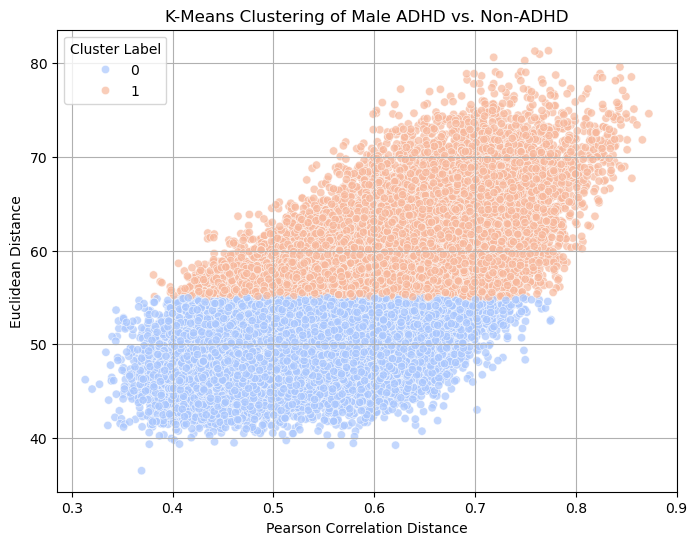

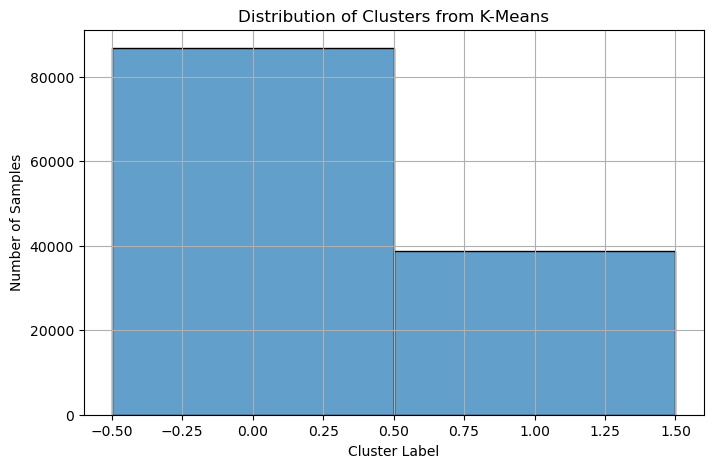

In [13]:
# FC matrices 
np.random.seed(42)
num_adhd_m = all_FC_hasADHD_M.shape[0]  # Number of male ADHD subjects
num_no_adhd_m = all_FC_noADHD_M.shape[0]  # Number of male non-ADHD subjects
fc_dim = 200  # Number of brain regions


for i in range(num_adhd_m):
    all_FC_hasADHD_M[i] = (all_FC_hasADHD_M[i] + all_FC_hasADHD_M[i].T) / 2

for i in range(num_no_adhd_m):
    all_FC_noADHD_M[i] = (all_FC_noADHD_M[i] + all_FC_noADHD_M[i].T) / 2

# Vectorize each FC matrix (flatten to shape (samples, 200*200))
all_FC_hasADHD_vec_M = all_FC_hasADHD_M.reshape(num_adhd_m, -1)
all_FC_noADHD_vec_M = all_FC_noADHD_M.reshape(num_no_adhd_m, -1)

# Compute distance matrices
pearson_corr_dist_M = 1 - np.corrcoef(np.vstack((all_FC_hasADHD_vec_M, all_FC_noADHD_vec_M)))  # 1 - correlation for distance
euclidean_dist_M = cdist(all_FC_hasADHD_vec_M, all_FC_noADHD_vec_M, metric='euclidean')
# manhattan_dist_M = cdist(all_FC_hasADHD_vec_M, all_FC_noADHD_vec_M, metric='cityblock')

# Create labels (1 = ADHD, 0 = Non-ADHD)
labels = np.array([1] * num_adhd_m + [0] * num_no_adhd_m)

# Stack distances into a feature matrix
distance_features_M = np.hstack((pearson_corr_dist_M[:num_adhd_m, num_adhd_m:].flatten().reshape(-1, 1),
                               euclidean_dist_M.flatten().reshape(-1, 1)))

# Clustering (K-Means & GMM)
num_clusters = 2
kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
kmeans_labels_M = kmeans.fit_predict(distance_features_M)

# Scatter plot of the K-Means clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x=distance_features_M[:, 0], y=distance_features_M[:, 1], hue=kmeans_labels_M, palette="coolwarm", alpha=0.7)
plt.title("K-Means Clustering of Male ADHD vs. Non-ADHD")
plt.xlabel("Pearson Correlation Distance")
plt.ylabel("Euclidean Distance")
plt.legend(title="Cluster Label")
plt.grid(True)
plt.show()

# Histogram of cluster distributions
plt.figure(figsize=(8, 5))
sns.histplot(kmeans_labels_M, bins=num_clusters, discrete=True, alpha=0.7, edgecolor="black")
plt.title("Distribution of Clusters from K-Means")
plt.xlabel("Cluster Label")
plt.ylabel("Number of Samples")
plt.grid(True)
plt.show()

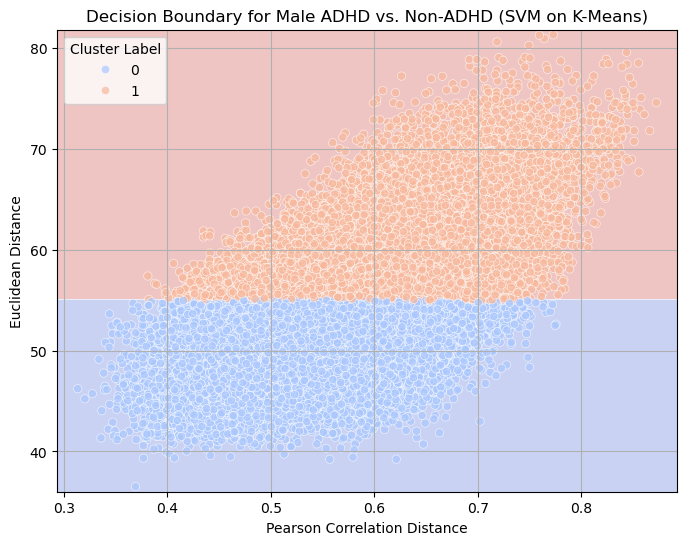

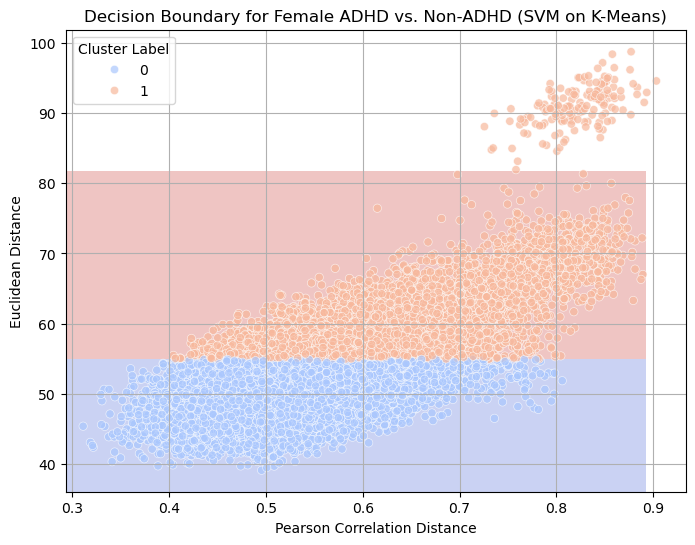

In [14]:
# Prepare data for decision boundary visualization (only Pearson & Euclidean distances)
X_male = distance_features_M[:, :2]  # Select first two features for male
X_female = distance_features_F[:, :2]  # Select first two features for female

# Train an SVM classifier on male data (K-Means labels as ground truth)
svm_male = SVC(kernel="linear", C=1.0, random_state=42)
svm_male.fit(X_male, kmeans_labels_M[:X_male.shape[0]])

# Train an SVM classifier on female data (K-Means labels as ground truth)
svm_female = SVC(kernel="linear", C=1.0, random_state=42)
svm_female.fit(X_female, kmeans_labels_F[:X_female.shape[0]])

# Create mesh grid for plotting decision boundary
x_min, x_max = np.min(X_male[:, 0]) - 0.02, np.max(X_male[:, 0]) + 0.02
y_min, y_max = np.min(X_male[:, 1]) - 0.5, np.max(X_male[:, 1]) + 0.5

xx, yy = np.meshgrid(np.linspace(x_min, x_max, 300), np.linspace(y_min, y_max, 300))
grid_points = np.c_[xx.ravel(), yy.ravel()]

# Predict class for each point in the mesh grid (for decision boundary)
Z_male = svm_male.predict(grid_points).reshape(xx.shape)
Z_female = svm_female.predict(grid_points).reshape(xx.shape)

# Plot decision boundary for male ADHD vs. Non-ADHD
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z_male, alpha=0.3, cmap="coolwarm")
sns.scatterplot(x=X_male[:, 0], y=X_male[:, 1], hue=kmeans_labels_M[:X_male.shape[0]], palette="coolwarm", alpha=0.7)
plt.title("Decision Boundary for Male ADHD vs. Non-ADHD (SVM on K-Means)")
plt.xlabel("Pearson Correlation Distance")
plt.ylabel("Euclidean Distance")
plt.legend(title="Cluster Label")
plt.grid(True)
plt.show()

# Plot decision boundary for female ADHD vs. Non-ADHD
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z_female, alpha=0.3, cmap="coolwarm")
sns.scatterplot(x=X_female[:, 0], y=X_female[:, 1], hue=kmeans_labels_F[:X_female.shape[0]], palette="coolwarm", alpha=0.7)
plt.title("Decision Boundary for Female ADHD vs. Non-ADHD (SVM on K-Means)")
plt.xlabel("Pearson Correlation Distance")
plt.ylabel("Euclidean Distance")
plt.legend(title="Cluster Label")
plt.grid(True)
plt.show()


In [15]:
# Extract SVM coefficients and intercept for male and female models
w_male = svm_male.coef_[0]
b_male = svm_male.intercept_[0]

w_female = svm_female.coef_[0]
b_female = svm_female.intercept_[0]

# Define x-range for the decision boundary line
x_range = np.linspace(x_min, x_max, 300)

# Compute y-values for the decision boundary using y = - (w1 / w2) * x - (b / w2)
decision_boundary_male = - (w_male[0] / w_male[1]) * x_range - (b_male / w_male[1])
decision_boundary_female = - (w_female[0] / w_female[1]) * x_range - (b_female / w_female[1])


📘 Multiclass Classifier
Accuracy: 0.74
              precision    recall  f1-score   support

 M: Non-ADHD       0.75      0.95      0.84      8680
     M: ADHD       0.78      0.98      0.87      3870
 F: Non-ADHD       0.37      0.09      0.14      2962
     F: ADHD       0.52      0.08      0.14      1188

    accuracy                           0.74     16700
   macro avg       0.60      0.52      0.50     16700
weighted avg       0.67      0.74      0.67     16700



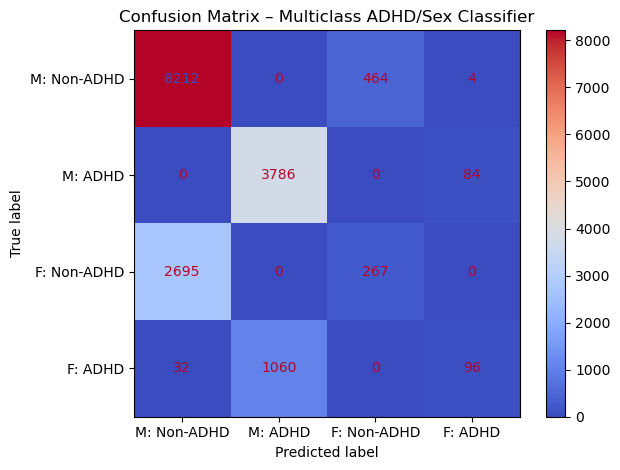

In [16]:
# Use SVM decision boundaries
adhd_labels_male = (distance_features_M[:, 1] >= (- (w_male[0] / w_male[1]) * distance_features_M[:, 0] - (b_male / w_male[1]))).astype(int)
adhd_labels_female = (distance_features_F[:, 1] >= (- (w_female[0] / w_female[1]) * distance_features_F[:, 0] - (b_female / w_female[1]))).astype(int)

# Build multiclass labels: 0/1/2/3
multi_labels = np.concatenate([
    adhd_labels_male,          # 0 or 1
    2 + adhd_labels_female     # 2 (Female-NonADHD) or 3 (Female-ADHD)
])
all_features = np.vstack((distance_features_M, distance_features_F))  # (samples, 3)
# More weight to Female classes
class_weight = {
    0: 1.0,   # Male-NonADHD
    1: 1.0,   # Male-ADHD
    2: 2.0,   # Female-NonADHD
    3: 2.0    # Female-ADHD
}

# Split
X_train, X_test, y_train, y_test = train_test_split(
    all_features, multi_labels, test_size=0.1, stratify=multi_labels, random_state=42
)

# Train Random Forest
rf_multi = RandomForestClassifier(
    n_estimators=200,
    max_depth=20,
    class_weight=class_weight,
    min_samples_split=310,
    # ccp_alpha=0.01,
    random_state=42
)
rf_multi.fit(X_train, y_train)

# Predict
y_pred = rf_multi.predict(X_test)

labels = ["M: Non-ADHD", "M: ADHD", "F: Non-ADHD", "F: ADHD"]

print("\n📘 Multiclass Classifier")
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")
print(classification_report(y_test, y_pred, target_names=labels))

ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels=labels, cmap="coolwarm")
plt.title("Confusion Matrix – Multiclass ADHD/Sex Classifier")
plt.tight_layout()
plt.show()

In [ ]:
# === 1. Load the test data ===
df_test = pd.read_csv('C:/Users/Kiana Kazeminejad/OneDrive - University of Calgary/WiDS 2025 Kiana/TEST/TEST_FUNCTIONAL_CONNECTOME_MATRICES.csv')

df_test.head()



,participant_id,0throw_1thcolumn,0throw_2thcolumn,0throw_3thcolumn,0throw_4thcolumn,0throw_5thcolumn,0throw_6thcolumn,0throw_7thcolumn,0throw_8thcolumn,0throw_9thcolumn,...,195throw_196thcolumn,195throw_197thcolumn,195throw_198thcolumn,195throw_199thcolumn,196throw_197thcolumn,196throw_198thcolumn,196throw_199thcolumn,197throw_198thcolumn,197throw_199thcolumn,198throw_199thcolumn
0,Cfwaf5FX7jWK,0.548480,0.713607,0.557319,0.524369,0.693364,0.770032,0.724406,0.390118,0.547912,...,0.080423,-0.054581,-0.088163,-0.028574,0.444847,0.350149,-0.012601,0.665750,0.560565,0.555732
1,vhGrzmvA3Hjq,0.427740,0.363022,0.402862,0.363003,0.534558,0.345347,0.409471,0.303328,0.402515,...,0.198009,-0.000724,0.083122,0.033043,0.687497,0.306229,0.717485,0.461809,0.559632,0.350027
2,ULliyEXjy4OV,0.139572,0.390106,-0.087041,0.196852,0.088148,0.023843,0.381782,0.068979,0.377488,...,0.051319,0.023630,-0.056819,0.117396,0.576086,0.517831,0.527044,0.605038,0.609856,0.750987
3,LZfeAb1xMtql,0.133561,0.778326,0.416355,0.471840,0.568460,0.633660,0.501113,0.345461,0.467943,...,0.046183,-0.238962,0.121868,-0.260970,0.646818,0.594902,0.608156,0.595459,0.683189,0.542296
4,EnFOUv0YK1RG,0.126699,0.575446,0.509422,0.363193,0.427544,0.449924,0.451796,0.223927,0.298248,...,0.315734,0.002234,0.290791,0.344149,0.480214,0.539824,0.447322,0.293088,0.148529,0.539823


In [26]:
# Drop the participant ID for now
participant_ids = df_test['participant_id'].values
X_test_upper = df_test.drop(columns='participant_id').values

n_subjects, n_features = X_test_upper.shape


In [31]:
X_test_upper.shape

(304, 200, 200)

In [32]:
df_test.shape[0]

304

In [28]:
num_regions = 200 

In [42]:
# Load your test data
df_test = pd.read_csv("C:/Users/Kiana Kazeminejad/OneDrive - University of Calgary/WiDS 2025 Kiana/TEST/TEST_FUNCTIONAL_CONNECTOME_MATRICES.csv")

# Extract participant IDs and FC features
participant_ids = df_test['participant_id'].values
X_flat = df_test.drop(columns='participant_id').values  # Shape: (n_patients, 19900)

# Define number of regions (based on number of upper triangle elements)
num_regions = 200
upper_tri_indices = np.triu_indices(num_regions, k=1)
num_patients = X_flat.shape[0]

# Initialize output array
X_test_fc = np.zeros((num_patients, num_regions, num_regions))

# Reconstruct FC matrices
for i in range(num_patients):
    matrix = np.zeros((num_regions, num_regions))
    matrix[upper_tri_indices] = X_flat[i]              # Fill upper triangle
    matrix += matrix.T                                 # Mirror to lower triangle
    np.fill_diagonal(matrix, 0)                        # Zero out diagonal (optional)
    X_test_fc[i] = matrix

X_test_fc.shape

(304, 200, 200)

In [46]:

# Constants
num_regions = 200
upper_tri_indices = np.triu_indices(num_regions, k=1)

# Load CSV (you can comment this out if already done)
# df_test = pd.read_csv("/mnt/data/TEST_FUNCTIONAL_CONNECTOME_MATRICES.csv")
participant_ids = df_test['participant_id'].values
X_flat = df_test.drop(columns='participant_id').values
num_patients = X_flat.shape[0]

# Reconstruct symmetric FC matrices
X_test_fc = np.zeros((num_patients, num_regions, num_regions))
for i in range(num_patients):
    mat = np.zeros((num_regions, num_regions))
    mat[upper_tri_indices] = X_flat[i]
    mat += mat.T
    np.fill_diagonal(mat, 0)
    X_test_fc[i] = mat

X_test_fc.shape

(304, 200, 200)

In [49]:
from scipy.stats import pearsonr

In [66]:
for i in range(X_test_fc.shape[0]):
    X_test_fc[i] = (X_test_fc[i] + X_test_fc[i].T) / 2

X_test_fc_vec = X_test_fc.reshape(X_test_fc.shape[0], -1)


# Use the group mean from training (mocked here as the average of test set itself for demo)
group_mean_train = np.mean(X_test_fc, axis=0)
group_mean_vec = group_mean_train.flatten().reshape(1, -1)

# Compute Pearson distance
def rowwise_pearson(x, y_vec):
    corrs = []
    for row in x:
        if np.std(row) == 0 or np.std(y_vec) == 0:
            corrs.append(0.0)
        else:
            r, _ = pearsonr(row, y_vec)
            corrs.append(r)
    return np.array(corrs)

pearson_corrs = rowwise_pearson(X_test_fc_vec, group_mean_vec.flatten())
pearson_dist = 1 - pearson_corrs
euclidean_dist = np.linalg.norm(X_test_fc_vec - group_mean_vec, axis=1)
euclidean_dist.shape

(304,)

In [ ]:
X_test_final = np.vstack([pearson_dist, euclidean_dist]).T

y_pred_test = rf_multi.predict(X_test_final)

pred_df = pd.DataFrame({
    'participant_id': participant_ids,
    'prediction': y_pred_test
})

pred_df

,participant_id,prediction
0,Cfwaf5FX7jWK,2
1,vhGrzmvA3Hjq,2
2,ULliyEXjy4OV,2
3,LZfeAb1xMtql,2
4,EnFOUv0YK1RG,2
...,...,...
299,UadZfjdEg7eG,2
300,IUEHiLmQAqCi,2
301,cRySmCadYFRO,2
302,E3MvDUtJadc5,2


In [85]:
pred_df['ADHD_Outcome'] = pred_df['prediction'] % 2  # 0 = Non-ADHD, 1 = ADHD
pred_df['Sex_F'] = (pred_df['prediction'] >= 2).astype(int)  # 0 = Male, 1 = Female
pred_df.drop(columns='prediction', inplace=True, axis=1)
# pred_df

In [86]:
pred_df.to_csv('test1_K.csv', index=False)

In [87]:
pred_df

,participant_id,ADHD_Outcome,Sex_F
0,Cfwaf5FX7jWK,0,1
1,vhGrzmvA3Hjq,0,1
2,ULliyEXjy4OV,0,1
3,LZfeAb1xMtql,0,1
4,EnFOUv0YK1RG,0,1
...,...,...,...
299,UadZfjdEg7eG,0,1
300,IUEHiLmQAqCi,0,1
301,cRySmCadYFRO,0,1
302,E3MvDUtJadc5,0,1
